# Shift mapping



In [12]:
import os
from astropy.io import fits
from astropy.nddata import block_replicate

indir = '/Users/ivo/Astro/PROJECTS/MINERVA/data/v1.0/'
f444w = 'uds-grizli-v8.0-minerva-v1.0-40mas-f444w-clear_drc_sci.fits'
f770w = 'uds-sbkgsub-v1.0-80mas-f770w_drz_sci.fits'

hdr_40 = fits.getheader(os.path.join(indir, f444w))
img_80 = fits.getdata(os.path.join(indir, f770w))
img_80[0:2,0:2] = [[0,1],[2,3]] # Set a value to test the block_replicate function
img_40 = block_replicate(img_80, 2, conserve_sum=True).astype(np.float32)
fits.writeto(os.path.join(indir,'test-40mas_f770w_sci.fits'), img_40, header=hdr_40, overwrite=True)
print(img_80[0:2,0:2])
print(img_40[0:4,0:4]*4)

hdr_40 = fits.getheader(os.path.join(indir, f444w.replace('sci','wht')))
img_80 = fits.getdata(os.path.join(indir, f770w.replace('sci','wht')))
img_40 = block_replicate(img_80, 2, conserve_sum=True).astype(np.float32)
fits.writeto(os.path.join(indir,'test-40mas_f770w_wht.fits'), img_40, header=hdr_40, overwrite=True)


[[0. 1.]
 [2. 3.]]
[[0. 0. 1. 1.]
 [0. 0. 1. 1.]
 [2. 2. 3. 3.]
 [2. 2. 3. 3.]]


In [ ]:

from pathlib import Path
import numpy as np
from mophongo.catalog import Catalog
from mophongo.astrometry import AstroCorrect, AstroMap

amap = AstroMap(order=1, snr_threshold=3.0)

data_dir = Path('../data')
#field = 'uds-medium'
field = 'uds-large'
#field_miri = field
field_miri_40 = field + '-40mas'
field_miri_80 = field + '-80mas'

sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'
img_770 = data_dir / f'{field_miri_80}-f770w_sci.fits'
wht_770 = data_dir / f'{field_miri_80}-f770w_wht.fits'

img_770_40 = data_dir / f'{field_miri_40}-f770w_sci.fits'
wht_770_40 = data_dir / f'{field_miri_40}-f770w_wht.fits'

cat444 = Catalog.from_fits(sci_444, wht_444, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, estimate_ivar=True) 
cat770_40 = Catalog.from_fits(img_770_40, wht_770_40, estimate_ivar=True) 

#cat770.segmap.get_indices([1,2,3])
import logging
logging.basicConfig(level=logging.INFO)


INFO:mophongo.astrometry:Measuring shifts between images with 461 sources and SNR > 30


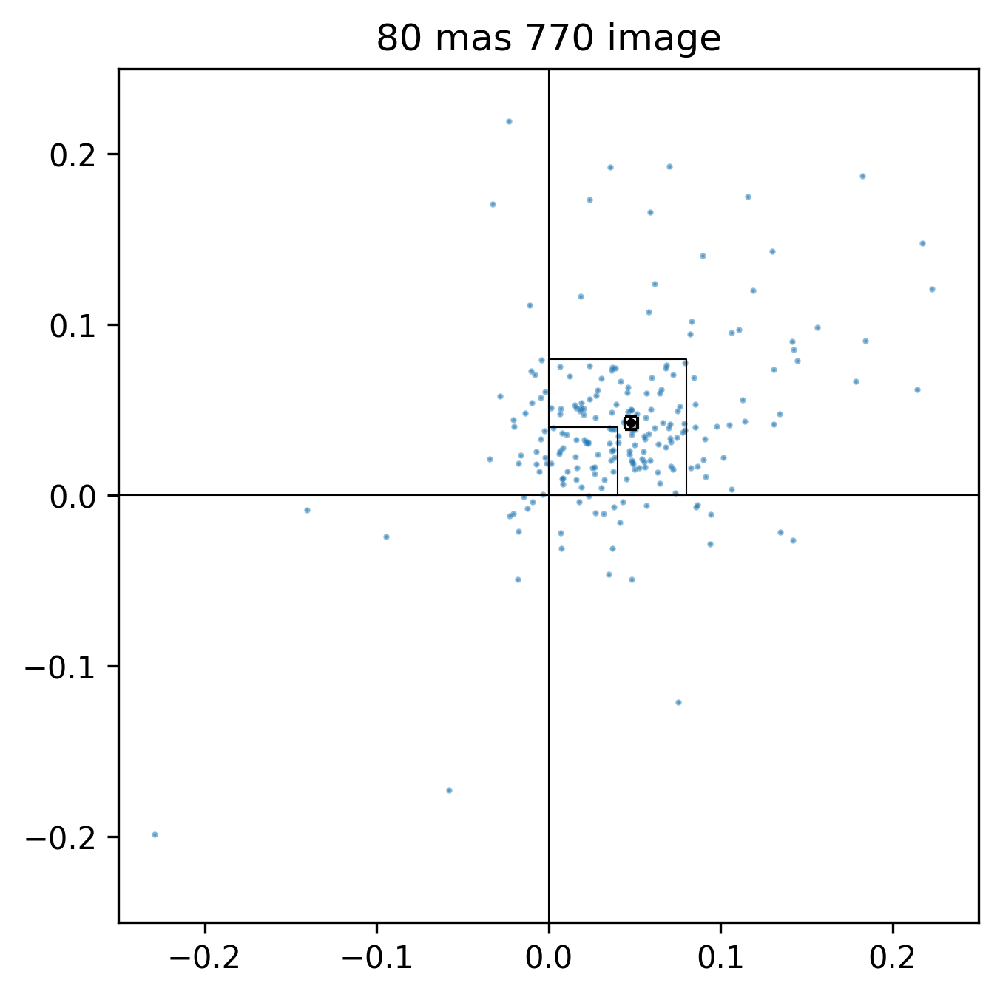

INFO:mophongo.astrometry:Measuring shifts between images with 529 sources and SNR > 30


../data/uds-large-80mas-f770w_sci.fits (3520, 7000) (1760, 3500) [0.04810743 0.04257808] [0.00392105 0.0037737 ]
../data/uds-large-40mas-f770w_sci.fits (3520, 7000) (1760, 3500) [0.04671086 0.04078692] [0.00348159 0.00337191]


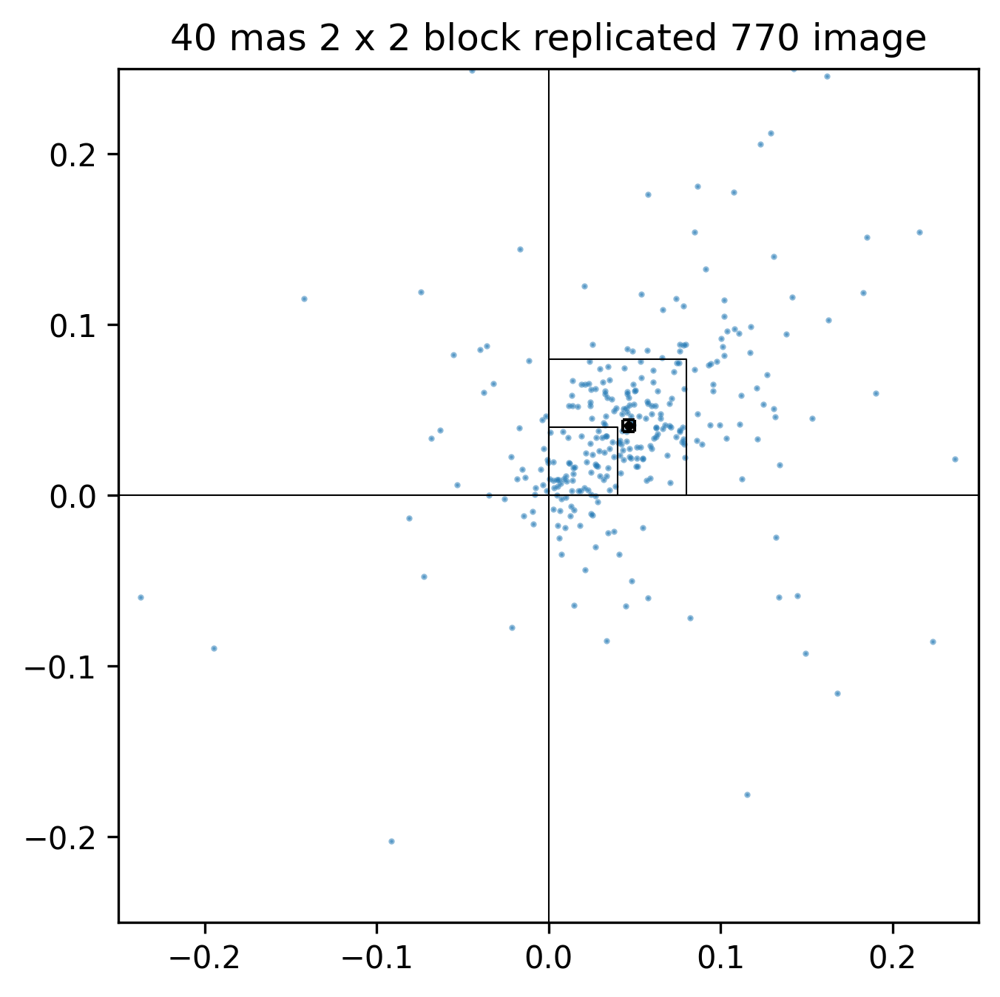

In [25]:
from matplotlib import pyplot as plt

ps = 0.04  # arcsec/pixel
amap.fit(cat444.sci, cat770.sci, cat770.table, wcs1=cat444.wcs, wcs2=cat770.wcs, snr_threshold=30, pixel_scale=ps)

plt.scatter(amap.dxy[:, 0], amap.dxy[:, 1], s=1, alpha=0.5)
r = 0.25
m = amap.dxy.mean(axis=0)
s = amap.dxy.std(axis=0)/np.sqrt(amap.dxy.shape[0]) 
v = np.array([0,1,1,0,0])
plt.plot(v*ps, np.roll(v,1)*ps, 'k-', lw=0.5)
plt.plot(v*ps*2, np.roll(v,1)*ps*2, 'k-', lw=0.5)
plt.errorbar(m[0], m[1], s[0], s[1], fmt='o', color='black', markersize=2, capsize=2, elinewidth=1, markeredgewidth=1)
plt.xlim(-r, r)
plt.ylim(-r, r)
plt.axvline(0, color='k', lw=0.5)
plt.axhline(0, color='k', lw=0.5)
plt.title('80 mas 770 image')
plt.show()
print(img_770, cat444.sci.shape, cat770.sci.shape, m, s )

# 40 mas block replicated image
amap.fit(cat444.sci, cat770_40.sci, cat770_40.table, snr_threshold=30, pixel_scale=0.04)

plt.scatter(amap.dxy[:, 0], amap.dxy[:, 1], s=1, alpha=0.5)
r = 0.25
m = amap.dxy.mean(axis=0)
s = amap.dxy.std(axis=0)/np.sqrt(amap.dxy.shape[0]) 
v = np.array([0,1,1,0,0])
plt.plot(v*ps, np.roll(v,1)*ps, 'k-', lw=0.5)
plt.plot(v*ps*2, np.roll(v,1)*ps*2, 'k-', lw=0.5)
plt.errorbar(m[0], m[1], s[0], s[1], fmt='o', color='black', markersize=2, capsize=2, elinewidth=1, markeredgewidth=1)
plt.xlim(-r, r)
plt.ylim(-r, r)
plt.axvline(0, color='k', lw=0.5)
plt.axhline(0, color='k', lw=0.5)
plt.title('40 mas 2 x 2 block replicated 770 image')
print(img_770_40, cat444.sci.shape, cat770.sci.shape, m, s )

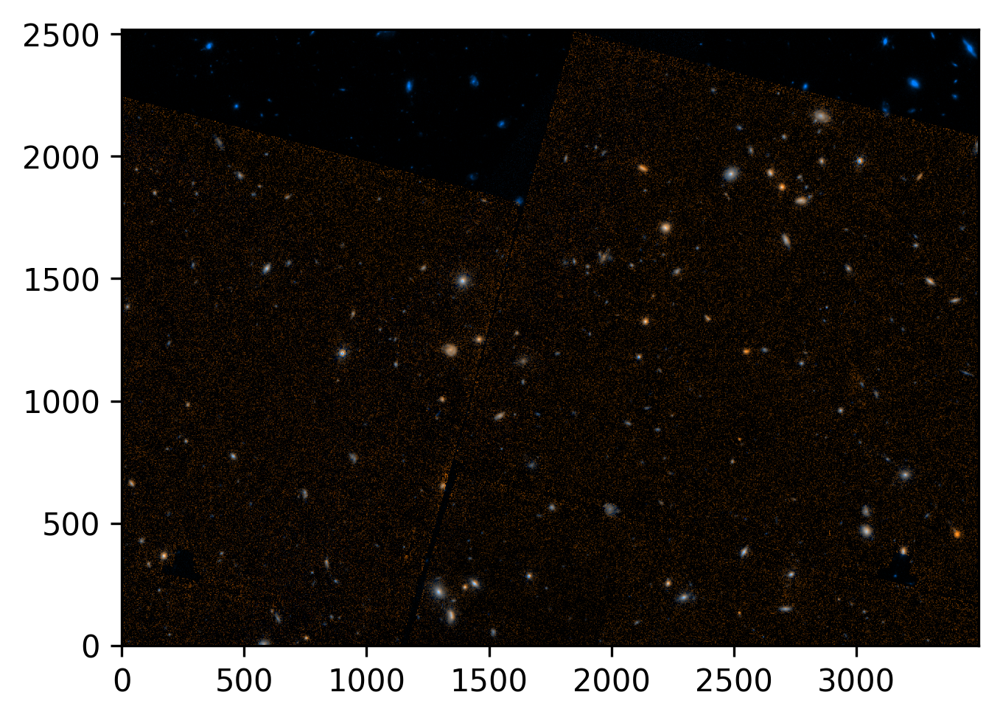

In [44]:
from astropy.visualization import make_lupton_rgb
from photutils.segmentation import SegmentationImage
from astropy.io import fits

indir = '/Users/ivo/Astro/PROJECTS/MINERVA/data/v1.0/testdata/'
f444w = 'uds-medium-f444w_sci.fits'
f770w = 'uds-medium-40mas-f770w_sci.fits'

b = fits.getdata(indir+f444w)
r = fits.getdata(indir+f770w)
b = 1.5*b / np.nanstd(b) 
r = r / np.nanstd(r)
g = (r + b) / 2.0
col = make_lupton_rgb(r, g, b, stretch=3)
plt.imshow(col, origin='lower', interpolation='nearest')

## Run photometry

In [45]:
import numpy as np
from pathlib import Path
from astropy.io import fits
from pathlib import Path
from astropy.io import fits
from mophongo.psf_map import PSFRegionMap
from mophongo.fit import FitConfig
from mophongo.catalog import Catalog
from mophongo import pipeline

data_dir = Path('../data')
field = 'uds-test'
#field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'

prm_kern = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_kernel_f770w.geojson'))
prm_444 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_psf.geojson'))
prm_770 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f770w_psf.geojson'))

# MIRI images
img_770 = fits.getdata(data_dir / f'{field}-f770w_sci.fits')
wht_770 = fits.getdata(data_dir / f'{field}-f770w_wht.fits')

# read in LW selected catalog
seg_LW = data_dir / f'{field}-LW_seg.fits'
cat444 = Catalog.from_fits(sci_444, wht_444, segmap=seg_LW, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, segmap=seg_LW, estimate_ivar=True) 

residual = [None, None, None, None]

Measuring inverse variance map...
Measuring inverse variance map...


/Users/ivo/Astro/PROJECTS/MOPHONGO/mophongo/mophongo/src/mophongo/catalog.py:411: RuntimeWarning: divide by zero encountered in divide
  error=np.sqrt(1.0 / self.ivar),


### Separate flux and astrometric fit

First fit fluxes, then astrometric shift field, iterate.

In [46]:
# test astrometry fit vs number of iterations for separate astro + flux fits
config = FitConfig(fit_astrometry_niter=0)
table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual = [res[0]]

cfgs = ({'poly':{'order': 1}},
        {'poly':{'order': 3}},
        {'gp':{'length_scale': 500}})  # initial guess: GP will optimize length_scale
        
astrom = [None]
for mdict in cfgs:
    # test astrometry fit vs number of iterations for separate astro + flux fits
    model = next(iter(mdict))
    config = FitConfig(fit_astrometry_niter=3,
                       astrom_model=model,
                       astrom_kwargs=mdict)
    table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                   cat444.segmap.data,
                                   weights=[cat444.ivar, cat770.ivar],
                                   catalog=cat444.table,
                                   psfs=[prm_444, prm_770],
                                   kernels=[None, prm_kern],
                                   wcs=[cat444.wcs] * 2,
                                   config=config)
    residual.append(res[0])
    astrom.append(fit.astro)




The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
2025225020657 INFO src=drizzlepac.haputils.astrometric_utils- ASTROMETRIC_CATALOG_URL = http://gsss.stsci.edu/webservices


INFO:drizzlepac.haputils.astrometric_utils:ASTROMETRIC_CATALOG_URL = http://gsss.stsci.edu/webservices


The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol
Pipeline (start) memory: 3.0 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=0, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 2}, 'gp': {'length_scale': 500}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='upsample', normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 2940.12it/s]

Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 3.0 GB
Using kernel lookup table uds-test-f444w_kernel_f770w



Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 3703.31it/s]


Pipeline (convolved) memory: 3.0 GB
Running iteration 1 of 1


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 42121.67it/s]


Pipeline (residual) memory: 3.0 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 44360.82it/s]


Done...
Pipeline (end) memory: 3.0 GB
Pipeline (start) memory: 3.0 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 1}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='upsample', normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 2351.64it/s]

Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 3.0 GB
Using kernel lookup table uds-test-f444w_kernel_f770w



Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 3852.95it/s]


Pipeline (convolved) memory: 3.0 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 42149.37it/s]
INFO:mophongo.pipeline:fitting astrometry separately


Pipeline (residual) memory: 3.1 GB
Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 44401.39it/s]
INFO:mophongo.pipeline:fitting astrometry separately


Pipeline (residual) memory: 3.1 GB
Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 42719.14it/s]
INFO:mophongo.pipeline:fitting astrometry separately


Pipeline (residual) memory: 3.1 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 40045.59it/s]


Done...
Pipeline (end) memory: 3.1 GB


AttributeError: 'list' object has no attribute 'astro'

In [ ]:
mdict = ({'gp':{'length_scale': 1000}})  # initial guess: GP will optimize length_scale
        
# test astrometry fit vs number of iterations for separate astro + flux fits
model = next(iter(mdict))
config = FitConfig(fit_astrometry_niter=3,
                    astrom_model=model,
                    astrom_kwargs=mdict)
table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual[-1] = res[0]
astrom[-1] = fit.astro

Pipeline (start) memory: 10.5 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'gp': {'length_scale': 1000}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='downsample', normal='tree')


Extracting templates: 100%|██████████| 10053/10053 [00:04<00:00, 2365.76it/s]


Pipepline: 10042 extracted templates, dropped 11.
Pipeline (templates) memory: 10.6 GB
Using kernel lookup table uds-large-f444w_kernel_f770w
Pruned 499 templates outside weight map


Convolving templates: 100%|██████████| 9543/9543 [00:04<00:00, 2038.17it/s]


Pipeline (convolved) memory: 10.6 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 9383/9383 [00:00<00:00, 25055.39it/s]


Pipeline (residual) memory: 10.6 GB


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 9384/9384 [00:00<00:00, 26474.59it/s]


Pipeline (residual) memory: 10.8 GB


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 9383/9383 [00:00<00:00, 27467.80it/s]


Pipeline (residual) memory: 10.8 GB


Building Normal matrix: 100%|██████████| 9383/9383 [00:00<00:00, 27943.32it/s]


Done...
Pipeline (end) memory: 10.8 GB


In [47]:
import numpy as np
import matplotlib.pyplot as plt

ny, nx = cat444.sci.shape
step = int(nx/20)
yg, xg = np.mgrid[step:ny:step, step:nx:step]
dx, dy = astrom[1](xg, yg)

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
ax[0].imshow(residual[0], origin='lower', cmap='gray', vmin=-1,vmax=1)
ax[0].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
ax[0].set_title("no shift") ; ax[0].set_xlabel("X") ; ax[0].set_ylabel("Y")
#ax[1].axis('off')

for i in range(1, len(ax)):
    dx, dy = astrom[i](xg, yg)
    ax[i].imshow(residual[i], origin='lower', cmap='gray', vmin=-1,vmax=1)
    ax[i].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
    ax[i].set_title(astrom[i].cfg.astrom_model+str(astrom[i].cfg.astrom_kwargs)) ; ax[i].set_xlabel("X") ; ax[i].set_ylabel("Y")
plt.tight_layout()
plt.show()

IndexError: list index out of range

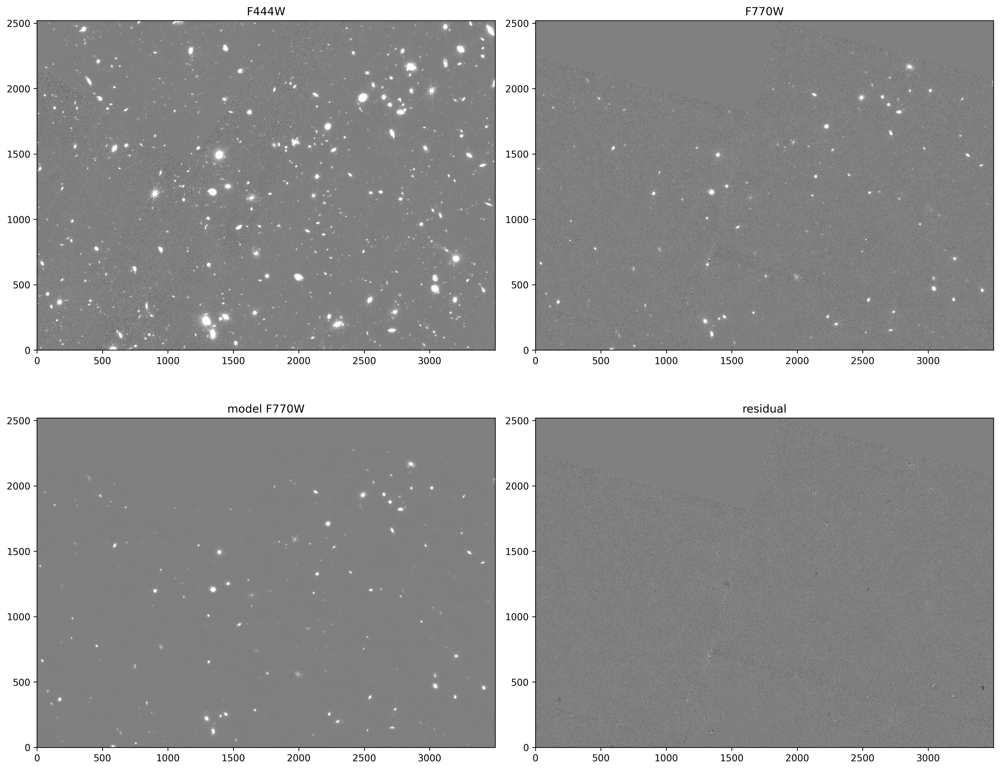

In [ ]:
from matplotlib import pyplot as plt
img = [cat444.sci*5, cat770.sci, cat770.sci - residual[1], residual[1]] 
titles = ['F444W', 'F770W', 'model F770W', 'residual']
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
for i in range(4):
    ax[i].imshow(img[i], origin='lower', cmap='gray', vmin=-1, vmax=1)
    ax[i].set_title(f'{titles[i]}')
plt.tight_layout() 

In [ ]:
mdict = {'poly':{'order': 3}}

In [ ]:
cfgs = ({'poly':{'order': 1}},
        {'poly':{'order': 3}},
        {'gp':{'length_scale': 400}})  # initial guess: GP will optimize length_scale
        
for mdict in cfgs:
    # test astrometry fit vs number of iterations for separate astro + flux fits
    model = next(iter(mdict))
    config = FitConfig(fit_astrometry_niter=3,
                       astrom_model=model,
                       astrom_centroid='correlation',
                       astrom_kwargs=mdict)
    table, res, fit = pipeline.run([cat444.sci, cat770.sci],
                                   cat444.segmap.data,
                                   weights=[cat444.ivar, cat770.ivar],
                                   catalog=cat444.table,
                                   psfs=[prm_444, prm_770],
                                   kernels=[None, prm_kern],
                                   wcs=[cat444.wcs] * 2,
                                   config=config)
    residual.append(res[0])
    astrom.append(fit.astro)

Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='correlation', astrom_kwargs={'poly': {'order': 1}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4336.97it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2541.98it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 21505.50it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 24073.69it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28340.39it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31019.60it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30854.13it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 27342.64it/s]


Distribution >99% chi2: [4.86565667]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32339.42it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='poly', astrom_centroid='correlation', astrom_kwargs={'poly': {'order': 3}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4692.37it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 1827.50it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30472.12it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30052.60it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28283.86it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30123.79it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 28139.80it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29986.79it/s]


Distribution >99% chi2: [4.49575515]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 30173.71it/s]


Done...
Pipeline (end) memory: 1.4 GB
Pipeline (start) memory: 1.4 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='correlation', astrom_kwargs={'gp': {'length_scale': 400}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=True, multi_tmpl_colour=False, normal='tree')


Extracting templates: 100%|██████████| 384/384 [00:00<00:00, 4807.04it/s]


Pipepline: 382 extracted templates, dropped 2.
Pipeline (templates) memory: 1.4 GB
Using kernel lookup table uds-test-f444w_kernel_f770w


Convolving templates: 100%|██████████| 382/382 [00:00<00:00, 2824.17it/s]


Pipeline (convolved) memory: 1.4 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31411.85it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 31357.75it/s]


Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 29859.93it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33547.41it/s]


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 32090.05it/s]


Pipeline (residual) memory: 1.4 GB


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 34007.39it/s]


Distribution >99% chi2: [3.9541216]
Adding 4 new templates for poor fits (chi^2/nu > 5.0)


Building Normal matrix: 100%|██████████| 382/382 [00:00<00:00, 33736.01it/s]


Done...
Pipeline (end) memory: 1.4 GB


In [ ]:
k = mdict.keys()

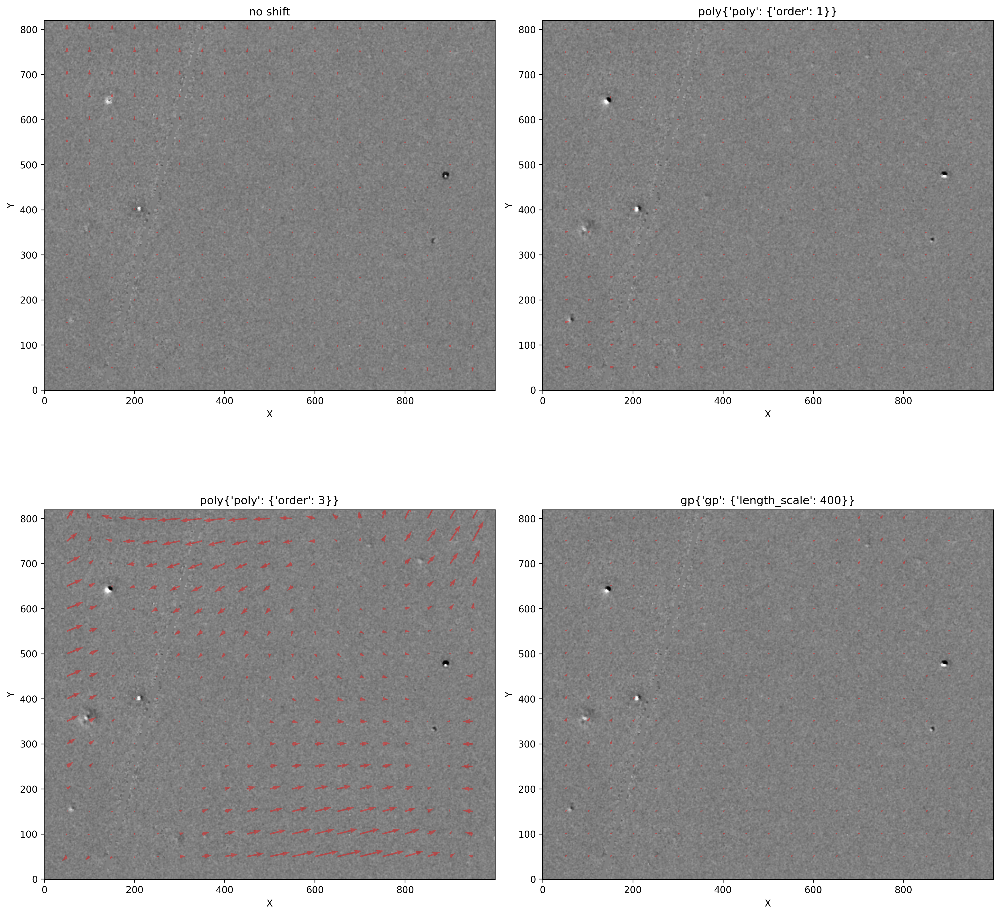

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

ny, nx = cat444.sci.shape
step = int(nx/20)
yg, xg = np.mgrid[step:ny:step, step:nx:step]
dx, dy = astrom[1](xg, yg)

fig, ax = plt.subplots(2, 2, figsize=(15, 15))
ax = ax.flatten()
ax[0].imshow(residual[0], origin='lower', cmap='gray', vmin=-1,vmax=1)
ax[0].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
ax[0].set_title("no shift") ; ax[0].set_xlabel("X") ; ax[0].set_ylabel("Y")
#ax[1].axis('off')

for i in range(1, len(ax)):
    dx, dy = astrom[i+3](xg, yg)
    ax[i].imshow(residual[i+3], origin='lower', cmap='gray', vmin=-1,vmax=1)
    ax[i].quiver(xg, yg, dx, dy, color='red', angles='xy', scale=25, alpha=0.4)
    ax[i].set_title(astrom[i].cfg.astrom_model+str(astrom[i].cfg.astrom_kwargs)) ; ax[i].set_xlabel("X") ; ax[i].set_ylabel("Y")
plt.tight_layout()
plt.show()

In [ ]:
len(residual), len(astrom)

(7, 7)